In [1]:
import os 


In [2]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path


def plot_spectrogram(file_path):
    y, sr = librosa.load(file_path, sr=22050)

    # Mel spectrogram
    mel = librosa.feature.melspectrogram(
        y=y,
        sr=sr,
        n_mels=128,
        n_fft=2048,
        hop_length=512
    )

    mel_db = librosa.power_to_db(mel, ref=np.max)

    plt.figure(figsize=(10, 4))
    librosa.display.specshow(
        mel_db,
        sr=sr,
        x_axis='time',
        y_axis='mel'
    )
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Spectrogram: {Path(file_path).name}")
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_from_folder(folder_path, max_files=5):
    folder = Path(folder_path)
    files = list(folder.glob("*.wav"))[:max_files]

    for f in files:
        plot_spectrogram(f)

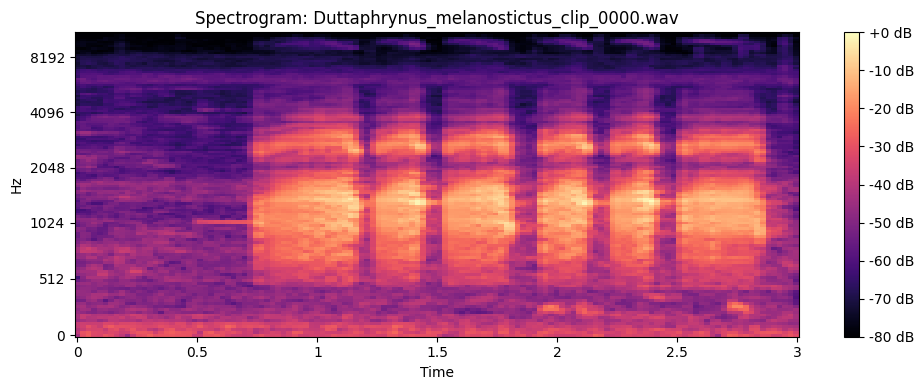

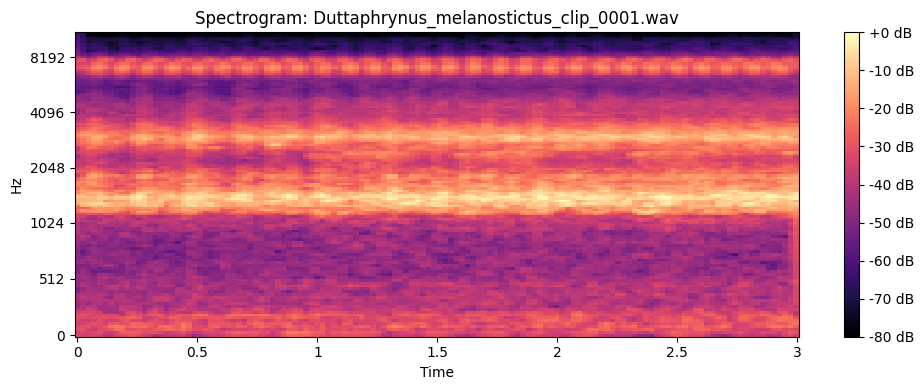

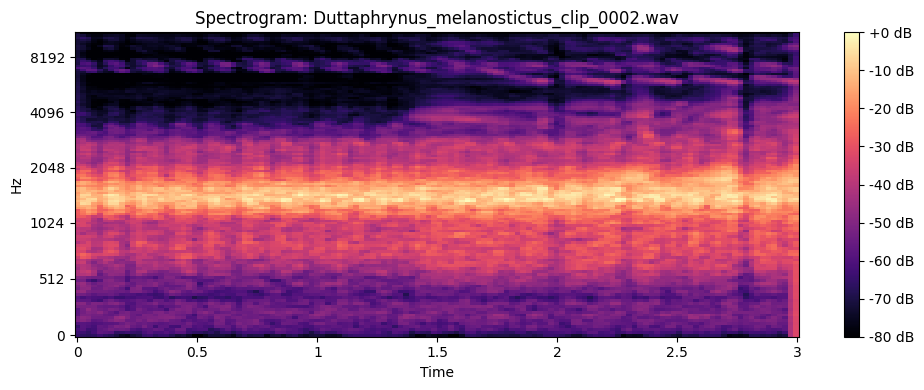

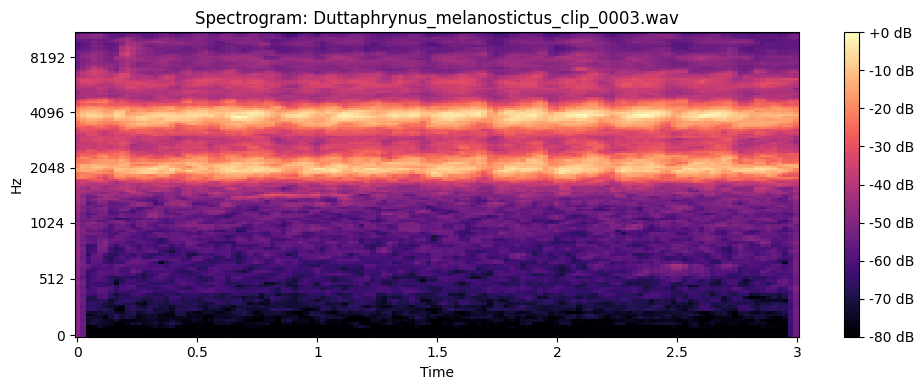

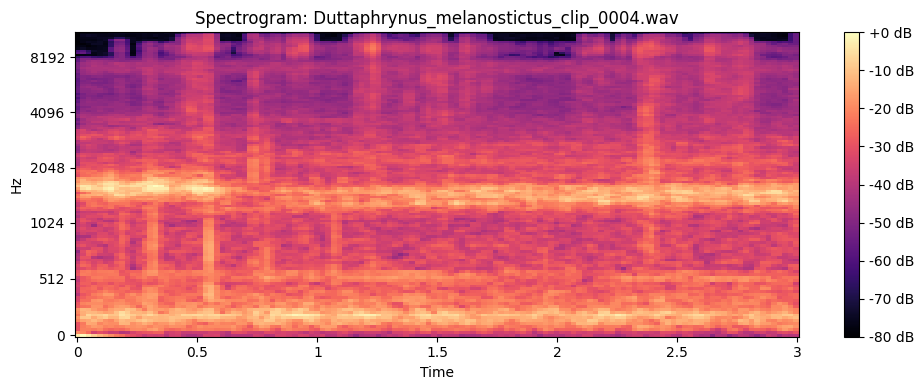

...

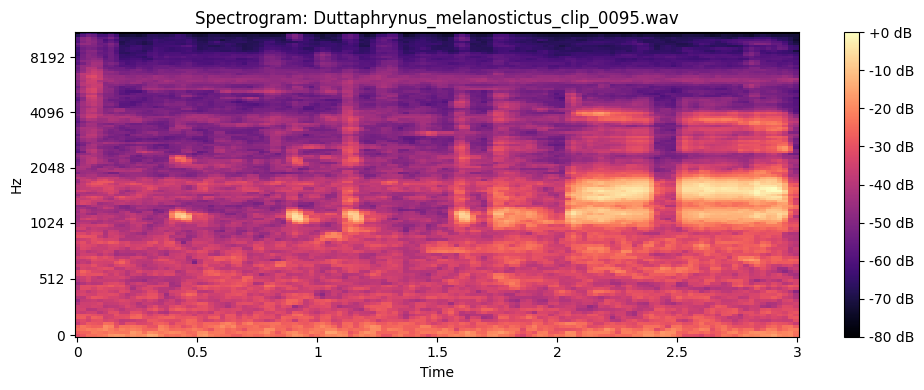

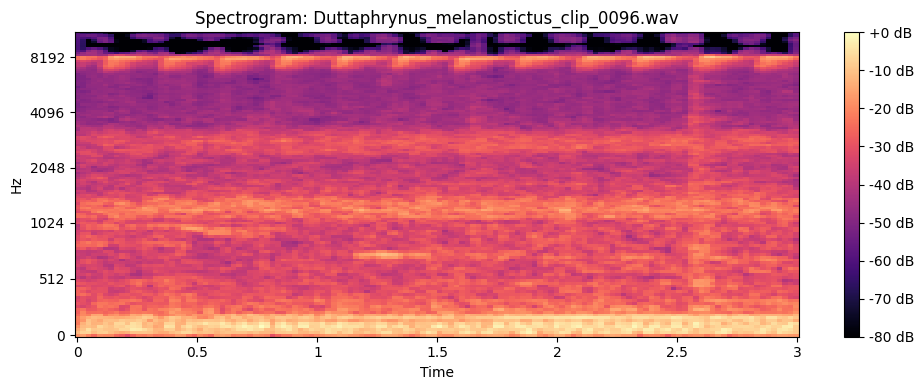

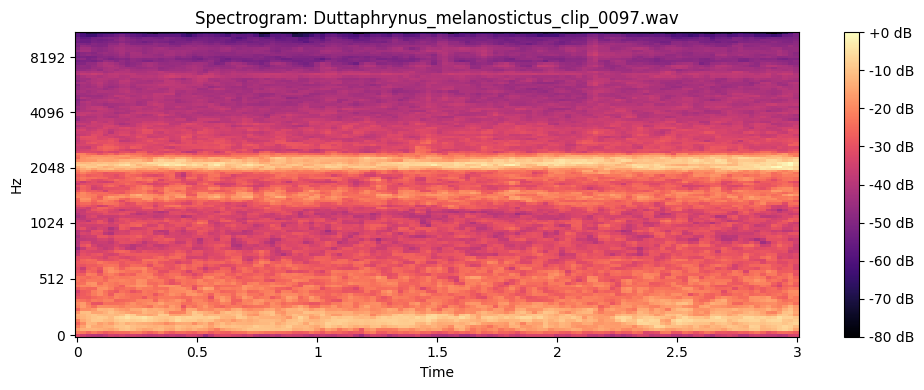

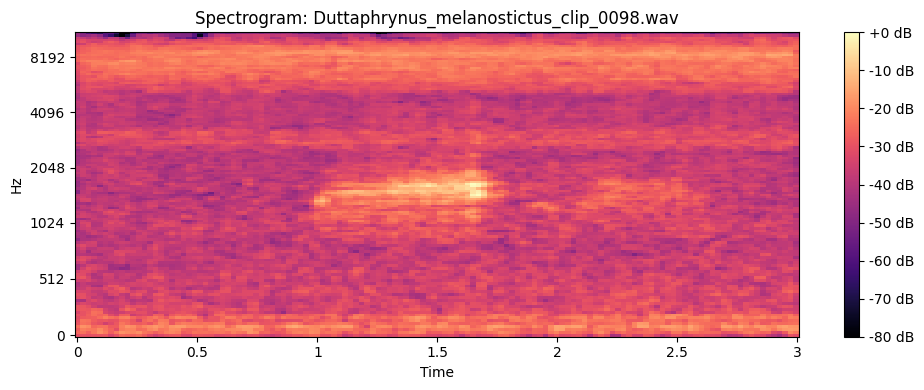

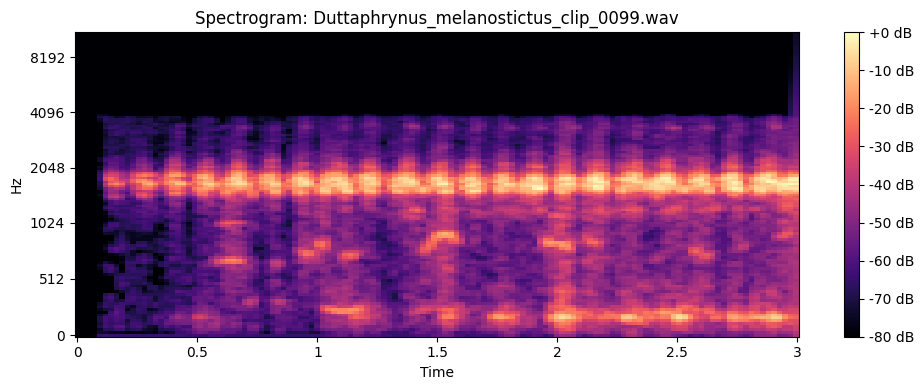

In [6]:
plot_from_folder(r'C:\Users\HP\Downloads\Foss_hack\prepared_audio\Duttaphrynus_melanostictus',100)

In [7]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from pathlib import Path

X = np.load(r"C:\Users\HP\Downloads\Foss_hack\features\X.npy")
y = np.load(r"C:\Users\HP\Downloads\Foss_hack\features\y.npy")

# Flatten
X_flat = X.reshape(X.shape[0], -1)

bad_indices = []

print("\n🔍 Detecting outliers...\n")

for cls in np.unique(y):
    idx = np.where(y == cls)[0]
    class_data = X_flat[idx]

    sim = cosine_similarity(class_data)

    # average similarity per sample
    avg_sim = sim.mean(axis=1)

    threshold = np.mean(avg_sim) - 2 * np.std(avg_sim)

    print(f"\nClass {cls}")
    print(f"Threshold: {threshold:.4f}")

    for i, val in enumerate(avg_sim):
        if val < threshold:
            bad_idx = idx[i]
            bad_indices.append(bad_idx)
            print(f"  ❌ Outlier sample index: {bad_idx} (sim={val:.4f})")

print("\nTotal bad samples:", len(bad_indices))


🔍 Detecting outliers...


Class 0
Threshold: 0.8035
  ❌ Outlier sample index: 14 (sim=0.7548)
  ❌ Outlier sample index: 22 (sim=0.7246)
  ❌ Outlier sample index: 35 (sim=0.7479)
  ❌ Outlier sample index: 99 (sim=0.7925)

Class 1
Threshold: 0.8739
  ❌ Outlier sample index: 123 (sim=0.8724)
  ❌ Outlier sample index: 124 (sim=0.8635)
  ❌ Outlier sample index: 131 (sim=0.8230)
  ❌ Outlier sample index: 154 (sim=0.7977)
  ❌ Outlier sample index: 157 (sim=0.8187)
  ❌ Outlier sample index: 166 (sim=0.8362)

Class 2
Threshold: 0.7867
  ❌ Outlier sample index: 214 (sim=0.7677)
  ❌ Outlier sample index: 238 (sim=0.7546)
  ❌ Outlier sample index: 269 (sim=0.7147)
  ❌ Outlier sample index: 275 (sim=0.7440)
  ❌ Outlier sample index: 278 (sim=0.4981)

Class 3
Threshold: 0.8257
  ❌ Outlier sample index: 315 (sim=0.8087)
  ❌ Outlier sample index: 337 (sim=0.6362)
  ❌ Outlier sample index: 398 (sim=0.7713)

Class 4
Threshold: 0.6501
  ❌ Outlier sample index: 407 (sim=0.3405)
  ❌ Outlier sample index: 

In [8]:
from pathlib import Path
root = Path(r'C:\Users\HP\Downloads\Foss_hack\Data-Pool-Bio-Acoustics-\exps\dataset_ready')
for cls in sorted(root.iterdir()):
    files = list(cls.iterdir())
    print(f"{cls.name}: {len(files)} files, e.g. {files[0].name}")

Duttaphrynus_melanostictus: 100 files, e.g. 4_1048092.wav
Euphlyctis_cyanophlyctis: 100 files, e.g. 2_980943.wav
Hoplobatrachus_tigerinus: 100 files, e.g. 3_980950.wav
Microhyla_ornata: 100 files, e.g. 1_980914.wav
Polypedates_maculatus: 100 files, e.g. aug_0000_gbif_4165544486.wav
